# 5.2  Convolutional Neural Network (CNN)

In [1]:
# 라이브러리 호출

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

Init Plugin
Init Graph Optimizer
Init Kernel


In [2]:
# fashion_mnist 데이터셋 내려받기

fashion_mnist = tf.keras.datasets.fashion_mnist
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

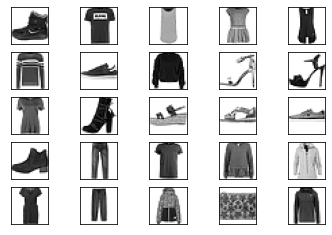

In [3]:
# 분류에 사용될 클래스 정의

class_names = ['T-shirt', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(x_train[i], cmap=plt.cm.binary)

plt.show()

In [4]:
# 심층 신경망을 이용한 모델 생성 및 훈련

x_train, x_test = x_train / 255.0, x_test / 255.0

model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(28,28)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(x_train, y_train, epochs=5)
model.evaluate(x_test, y_test, verbose=2)

Metal device set to: Apple M1


2022-05-11 13:21:21.130899: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-05-11 13:21:21.131315: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Epoch 1/5
   1/1875 [..............................] - ETA: 5:25 - loss: 2.6386 - accuracy: 0.0312

2022-05-11 13:21:21.601493: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-05-11 13:21:21.604221: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-05-11 13:21:21.705575: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


1875/1875 [==============================] - 7s 4ms/step - loss: 0.5257 - accuracy: 0.8134
Epoch 2/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3951 - accuracy: 0.8573
Epoch 3/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3583 - accuracy: 0.8698
Epoch 4/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3375 - accuracy: 0.8752
Epoch 5/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3216 - accuracy: 0.8823


2022-05-11 13:21:53.511046: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


313/313 - 1s - loss: 0.3752 - accuracy: 0.8636


[0.3752465844154358, 0.8636000156402588]

In [5]:
# 라이브러리 호출

import numpy as np
from skimage.color import rgb2lab, rgb2gray, lab2rgb
from skimage.io import imread, imshow
import matplotlib.pyplot as plt

In [8]:
!pip install scikit-image

     |████████████████████████████████| 12.4 MB 15.0 MB/s            
     |████████████████████████████████| 2.0 MB 10.6 MB/s            
     |████████████████████████████████| 3.4 MB 8.7 MB/s            
     |████████████████████████████████| 195 kB 9.1 MB/s            
     |████████████████████████████████| 4.3 MB 3.6 MB/s            


In [6]:
def print_image_summary(image, labels):
    
    print('-------------')
    print('Image Details')
    print('-------------')
    print(f'Image dimensions: {image.shape}')
    print('Channels:')
    
    if len(labels) == 1:
        image = image[..., np.newaxis]
    
    for i, lab in enumerate(labels):
        min_val = np.min(image[:,:,i])
        max_val = np.max(image[:,:,i])
        print(f'{lab} : min={min_val:.4f}, max={max_val:.4f}')

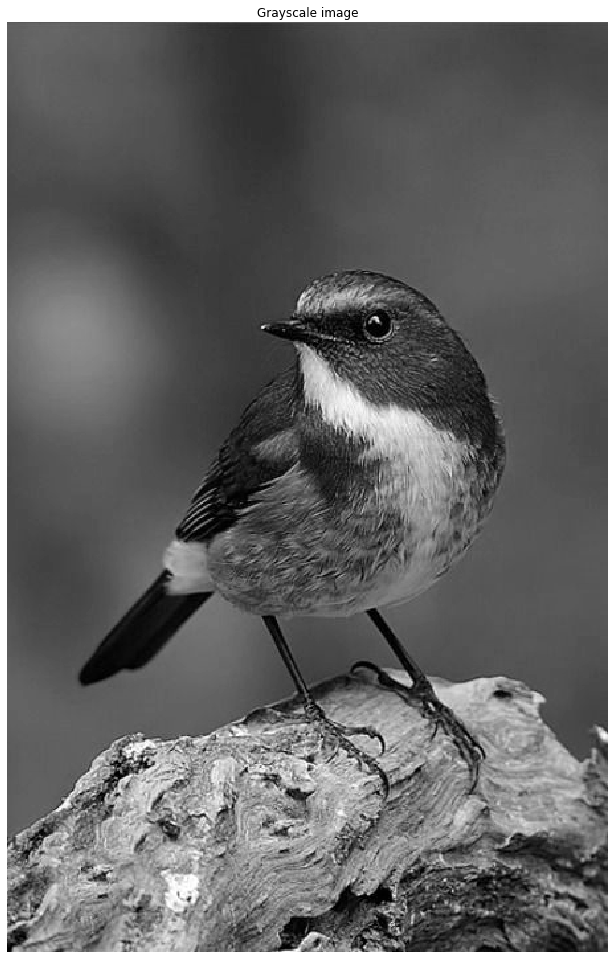

In [7]:
# 이미지 호출

image_gs = imread('data/chap05/bird.jpg', as_gray=True)
fig, ax = plt.subplots(figsize=(9,16))
imshow(image_gs, ax=ax)
ax.set_title('Grayscale image')
ax.axis('off');

In [8]:
# 이미지 정보 표현

print_image_summary(image_gs, ['G'])

-------------
Image Details
-------------
Image dimensions: (703, 454)
Channels:
G : min=0.0000, max=1.0000


In [9]:
# 데이터 전처리

X_train_final = x_train.reshape((-1,28,28,1)) / 255.
X_test_final = x_test.reshape((-1,28,28,1)) / 255.

In [11]:
# CNN을 이용한 모델 생성

model_with_conv = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), padding='same', activation='relu',
                           input_shape=(28,28,1)),
    tf.keras.layers.MaxPooling2D((2,2), strides=2),
    tf.keras.layers.Conv2D(64, (3,3), padding='same', activation='relu'),
    tf.keras.layers.MaxPooling2D((2,2), strides=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(10, activation='softmax')
])

model_with_conv.compile(optimizer='adam',
                        loss='sparse_categorical_crossentropy',
                        metrics=['accuracy'])

In [14]:
# 모델 훈련 및 성능 평가

model_with_conv.fit(X_train_final, y_train, epochs=5)
model_with_conv.evaluate(X_test_final, y_test, verbose=2)

Epoch 1/5
1875/1875 [==============================] - 12s 6ms/step - loss: 0.3539 - accuracy: 0.8701
Epoch 2/5
1875/1875 [==============================] - 12s 6ms/step - loss: 0.3351 - accuracy: 0.8780
Epoch 3/5
1875/1875 [==============================] - 11s 6ms/step - loss: 0.3174 - accuracy: 0.8838
Epoch 4/5
1875/1875 [==============================] - 11s 6ms/step - loss: 0.3053 - accuracy: 0.8879
Epoch 5/5
1875/1875 [==============================] - 11s 6ms/step - loss: 0.2915 - accuracy: 0.8928
313/313 - 1s - loss: 0.3264 - accuracy: 0.8843


[0.326385498046875, 0.8843000531196594]

In [13]:
print("Num GPUs Available:", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available: 1


# 5.3 Transfer Learning

## 5.3.1 Feature Extractor

In [16]:
# 라이브러리 호출

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalMaxPool2D, GlobalAveragePooling2D
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [17]:
# 사전 훈련된 모델 내려받기

model = ResNet50(include_top=True,
                 weights='imagenet',
                 input_tensor=None,
                 input_shape=None,
                 pooling=None,
                 classes=1000)

102973440/102967424 [==============================] - 4s 0us/step


In [18]:
# ResNet50 네트워크 구조 확인

model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [19]:
model.trainable = False
model = Sequential([model,
                    Dense(2, activation='sigmoid')])

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 1000)              25636712  
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 2002      
Total params: 25,638,714
Trainable params: 2,002
Non-trainable params: 25,636,712
_________________________________________________________________


In [20]:
# 훈련에 사용될 환경 설정

model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

In [27]:
# 모델 훈련

BATCH_SIZE = 32
image_height = 224
image_width = 224
train_dir = 'data/chap05/catanddog/train'
valid_dir = 'data/chap05/catanddog/validation'

train = ImageDataGenerator(
                    rescale=1.0/255.0,
                    rotation_range=10,
                    width_shift_range=0.1,
                    height_shift_range=0.1,
                    shear_range=0.1,
                    zoom_range=0.1)

train_generator = train.flow_from_directory(train_dir,
                                            target_size=(image_height, image_width),
                                            color_mode='rgb',
                                            batch_size=BATCH_SIZE,
                                            seed=1,
                                            shuffle=True,
                                            class_mode='categorical')

valid = ImageDataGenerator(rescale=1.0/255.0)

valid_generator = valid.flow_from_directory(valid_dir,
                                            target_size=(image_height, image_width),
                                            color_mode='rgb',
                                            batch_size=BATCH_SIZE,
                                            seed=7,
                                            shuffle=True,
                                            class_mode='categorical')

history = model.fit(train_generator,
                    epochs=10,
                    validation_data=valid_generator,
                    verbose=2)

Found 385 images belonging to 2 classes.
Found 98 images belonging to 2 classes.
Epoch 1/10
13/13 - 7s - loss: 0.6925 - accuracy: 0.5273 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/10
13/13 - 5s - loss: 0.6926 - accuracy: 0.5273 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/10
13/13 - 5s - loss: 0.6926 - accuracy: 0.5273 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/10
13/13 - 5s - loss: 0.6925 - accuracy: 0.5273 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/10
13/13 - 5s - loss: 0.6925 - accuracy: 0.5273 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 6/10
13/13 - 5s - loss: 0.6923 - accuracy: 0.5273 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 7/10
13/13 - 5s - loss: 0.6922 - accuracy: 0.5273 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 8/10
13/13 - 5s - loss: 0.6921 - accuracy: 0.5273 - val_loss: 0.6934 - val_accuracy: 0.5000
Epoch 9/10
13/13 - 5s - loss: 0.6920 - accuracy: 0.5273 - val_loss: 0.6934 - val_accuracy: 0.5000
Epoch 10/10
13/13 - 5s - loss: 0.6921

Text(0.5, 1.0, 'loss')

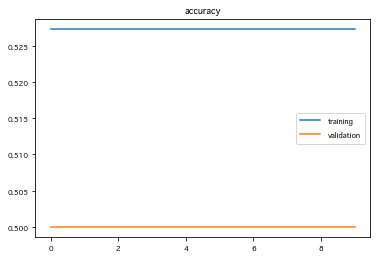

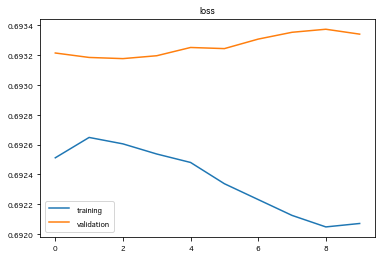

In [28]:
# 모델의 정확도 시각화

import matplotlib as mpl
import matplotlib.pylab as plt
from matplotlib import font_manager

font_fname = '/System/Library/Fonts/Apple Symbols.ttf'
font_family = font_manager.FontProperties(fname=font_fname).get_name()

plt.rcParams["font.family"] = font_family

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

plt.plot(epochs, accuracy, label='training')
plt.plot(epochs, val_accuracy, label='validation')
plt.legend()
plt.title('accuracy')
plt.figure()

plt.plot(epochs, loss, label='training')
plt.plot(epochs, val_loss, label='validation')
plt.legend()
plt.title('loss')

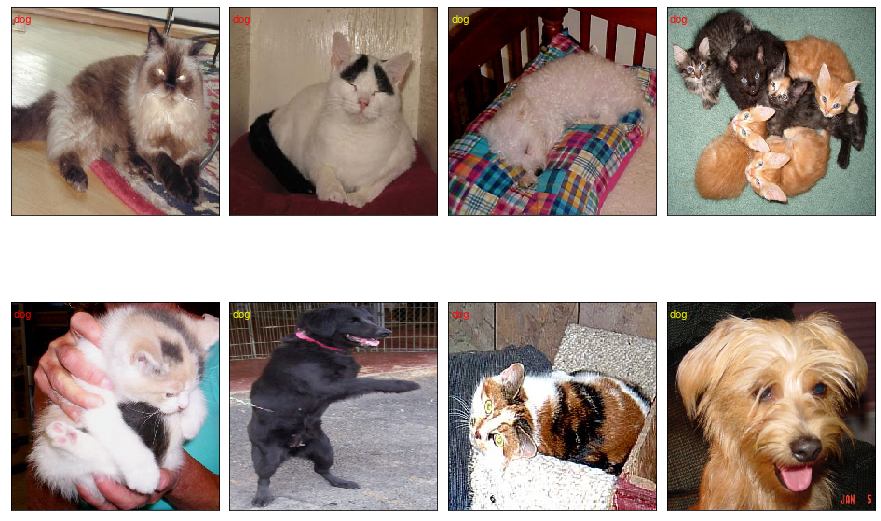

In [30]:
# 훈련된 모델의 예측

class_names = ['cat', 'dog']
validation, label_batch = next(iter(valid_generator))
prediction_values = np.argmax(model.predict(validation), axis=-1)

fig = plt.figure(figsize=(12,8))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

for i in range(8):
    ax = fig.add_subplot(2, 4, i+1, xticks=[], yticks=[])
    ax.imshow(validation[i,:], cmap=plt.cm.gray_r, interpolation='nearest')
    if prediction_values[i] == np.argmax(label_batch[i]):
        ax.text(3, 17, class_names[prediction_values[i]], color='yellow', fontsize=14)
    else:
        ax.text(3, 17, class_names[prediction_values[i]], color='red', fontsize=14)

In [31]:
!pip install tensorflow_hub

     |████████████████████████████████| 108 kB 8.3 MB/s            


In [32]:
# 라이브러리 호출 및 ResNet50 내려받기

import tensorflow_hub as hub
model = tf.keras.Sequential([
    hub.KerasLayer("https://tfhub.dev/google/imagenet/resnet_v2_152/feature_vector/4",
                   input_shape=(224,224,3),
                   trainable=False),
    tf.keras.layers.Dense(2, activation='softmax')
])

In [33]:
# 데이터 확장

train = ImageDataGenerator(
                rescale=1./255.,
                rotation_range=0.1,
                width_shift_range=0.1,
                height_shift_range=0.1,
                shear_range=0.1,
                zoom_range=0.1)

train_generator = train.flow_from_directory(train_dir,
                                            target_size=(image_height, image_width),
                                            color_mode='rgb',
                                            batch_size=BATCH_SIZE,
                                            seed=1,
                                            shuffle=True,
                                            class_mode='categorical')

valid = ImageDataGenerator(rescale=1.0/255.0)

valid_generator = valid.flow_from_directory(valid_dir,
                                            target_size=(image_height, image_width),
                                            color_mode='rgb',
                                            batch_size=BATCH_SIZE,
                                            seed=7,
                                            shuffle=True,
                                            class_mode='categorical')

model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

Found 385 images belonging to 2 classes.
Found 98 images belonging to 2 classes.


In [34]:
# 라이브러리 및 데이터 호출

from numpy import expand_dims
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from matplotlib import pyplot as plt

img = load_img('data/chap05/bird.jpg')
data = img_to_array(img)

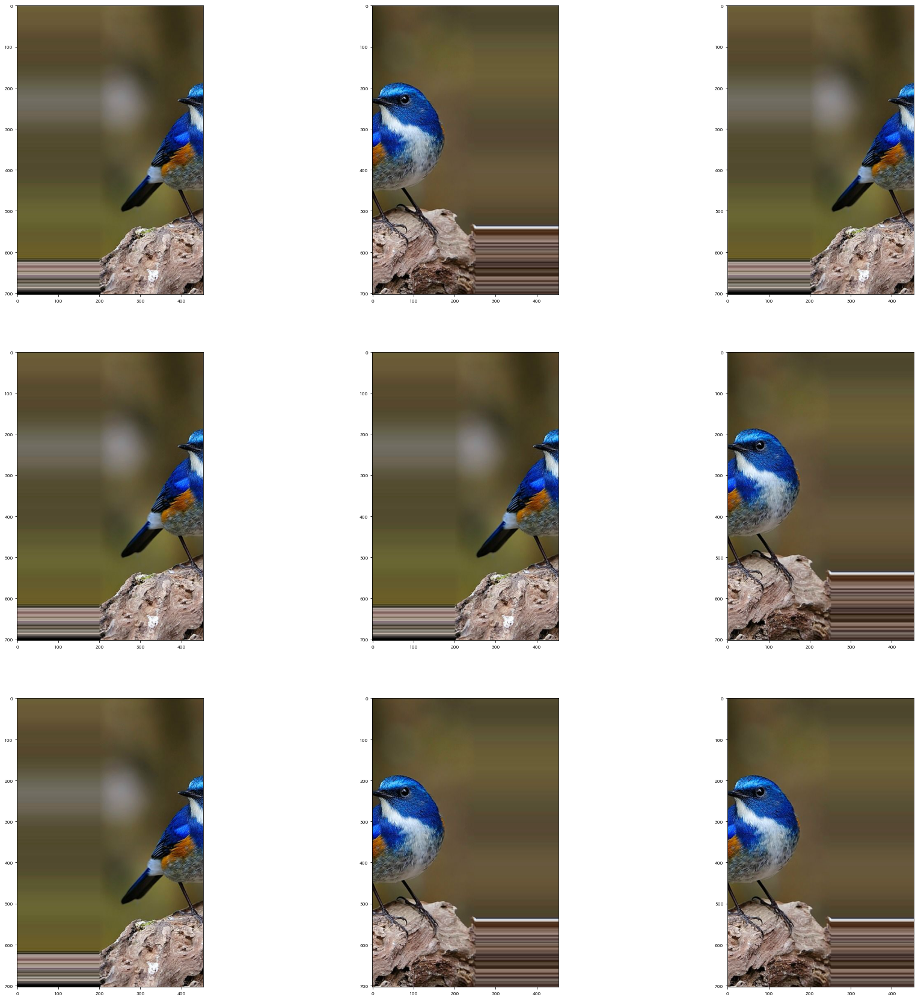

In [35]:
# width_shift_range를 이용한 이미지 증가

img_data = expand_dims(data, 0)
data_gen = ImageDataGenerator(width_shift_range=[-200,200])
data_iter = data_gen.flow(img_data, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3, 3, i+1)
    batch = data_iter.next()
    image = batch[0].astype('uint16')
    plt.imshow(image)
plt.show()

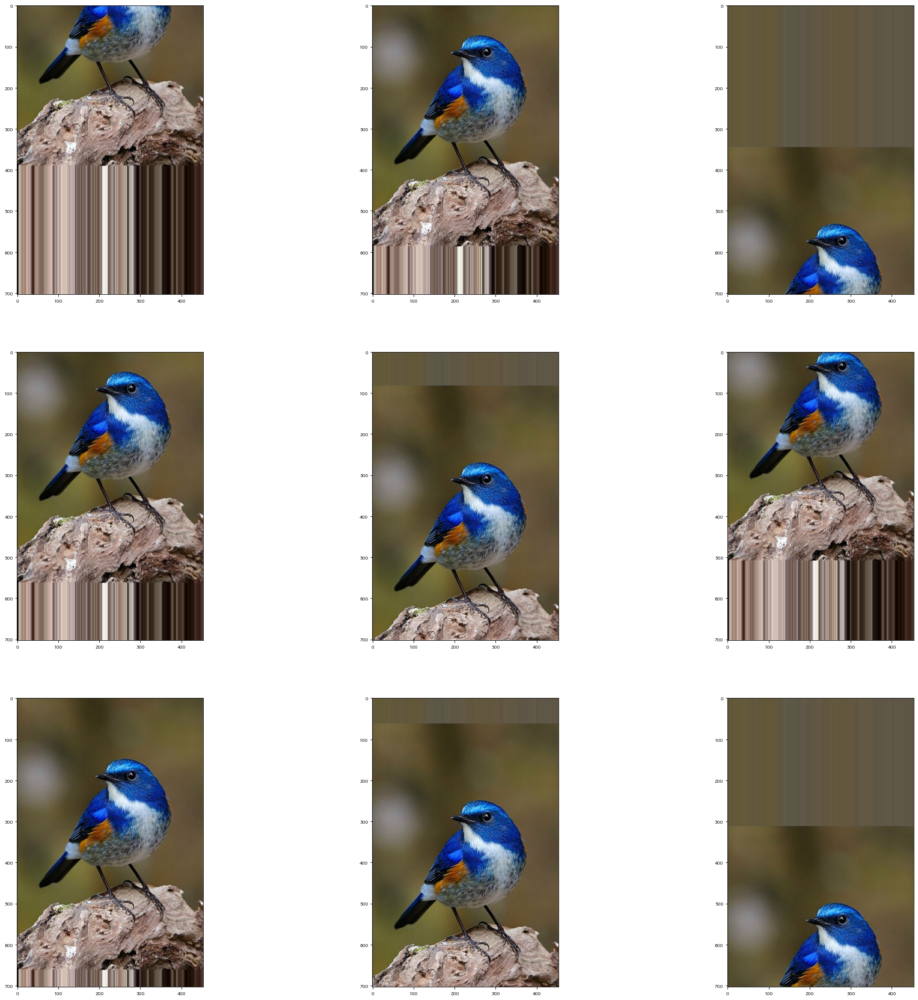

In [36]:
# height_shift_range를 이용한 이미지 증가

img_data = expand_dims(data, 0)
data_gen = ImageDataGenerator(height_shift_range=0.5)
data_iter = data_gen.flow(img_data, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3, 3, i+1)
    batch = data_iter.next()
    image = batch[0].astype('uint16')
    plt.imshow(image)
plt.show()

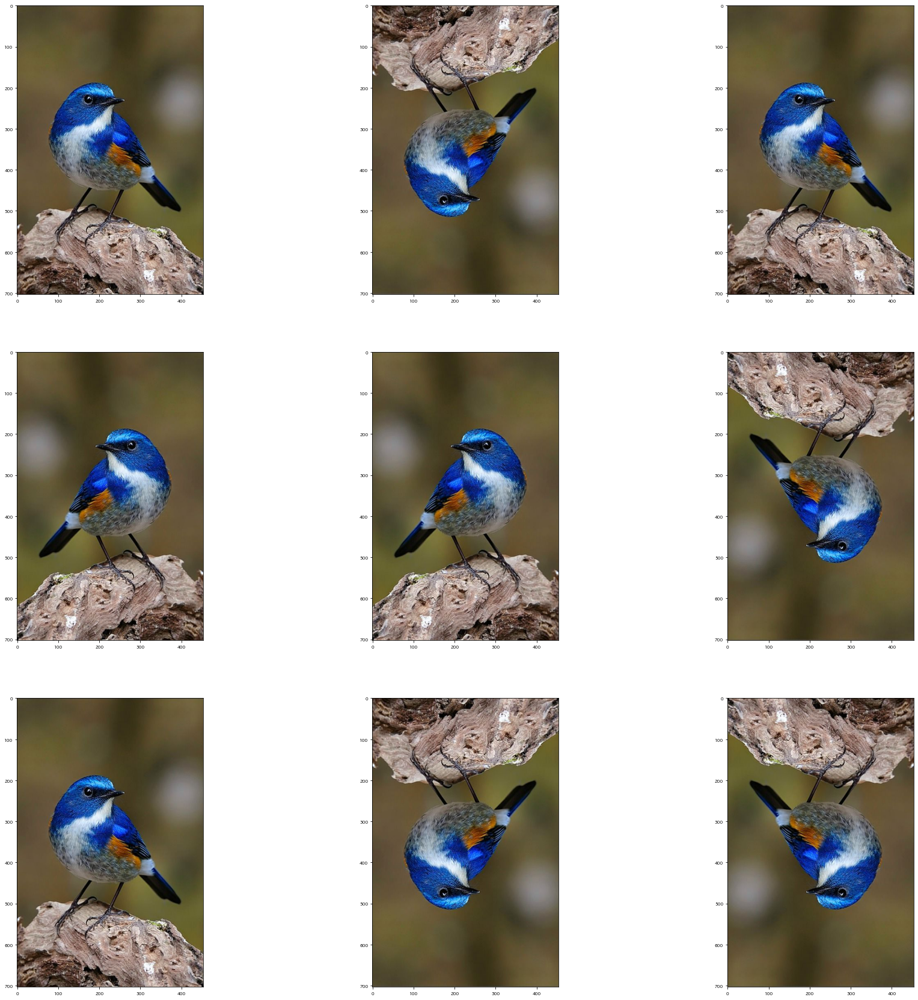

In [37]:
# flip을 이용한 이미지 증가

img_data = expand_dims(data, 0)
data_gen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
data_iter = data_gen.flow(img_data, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3, 3, i+1)
    batch = data_iter.next()
    image = batch[0].astype('uint16')
    plt.imshow(image)
plt.show()

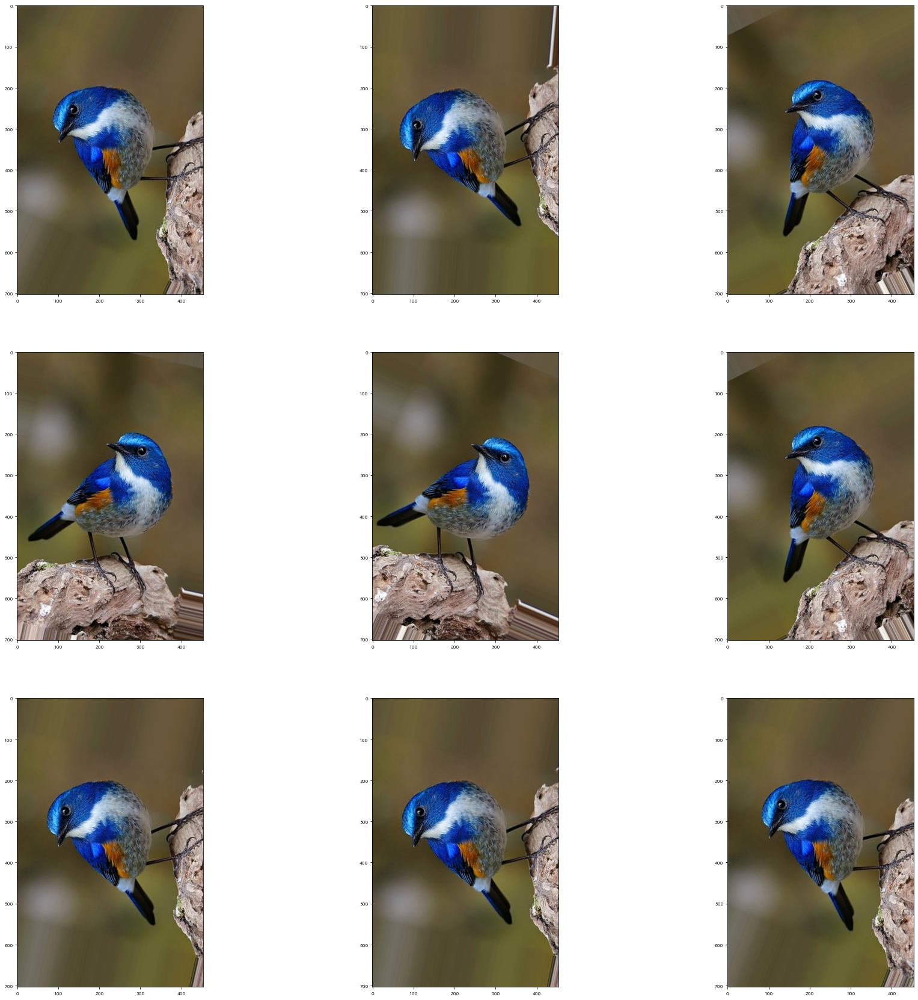

In [38]:
# rotation_range를 이용한 이미지 증가

img_data = expand_dims(data, 0)
data_gen = ImageDataGenerator(rotation_range=90)
data_iter = data_gen.flow(img_data, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3, 3, i+1)
    batch = data_iter.next()
    image = batch[0].astype('uint16')
    plt.imshow(image)
plt.show()

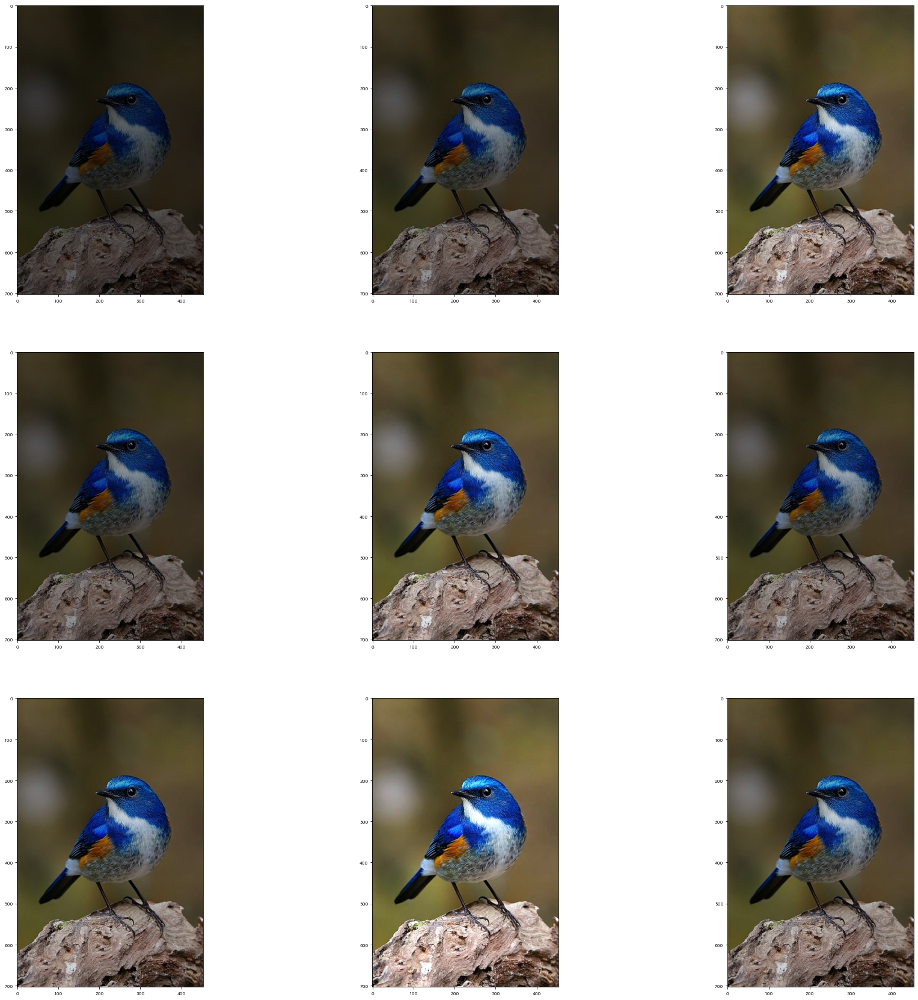

In [39]:
# brightness를 이용한 이미지 증가

img_data = expand_dims(data, 0)
data_gen = ImageDataGenerator(brightness_range=[0.3, 1.2])
data_iter = data_gen.flow(img_data, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3, 3, i+1)
    batch = data_iter.next()
    image = batch[0].astype('uint16')
    plt.imshow(image)
plt.show()

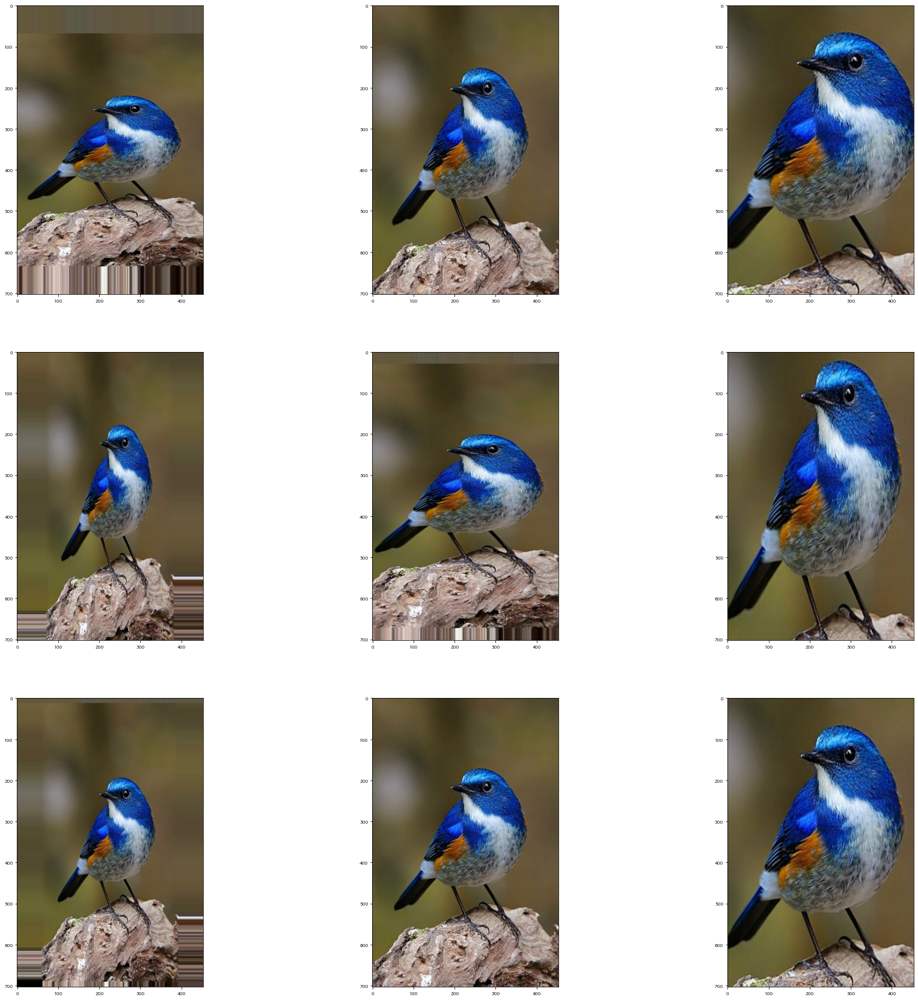

In [40]:
# zoom을 이용한 이미지 증가

img_data = expand_dims(data, 0)
data_gen = ImageDataGenerator(zoom_range=[0.4, 1.5])
data_iter = data_gen.flow(img_data, batch_size=1)
fig = plt.figure(figsize=(30,30))
for i in range(9):
    plt.subplot(3, 3, i+1)
    batch = data_iter.next()
    image = batch[0].astype('uint16')
    plt.imshow(image)
plt.show()

In [41]:
# 모델 훈련

history = model.fit(train_generator,
                    epochs=10,
                    validation_data=valid_generator,
                    verbose=2)

Epoch 1/10


2022-05-11 16:10:24.803682: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-05-11 16:10:35.120704: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


13/13 - 16s - loss: 0.5016 - accuracy: 0.8000 - val_loss: 0.1847 - val_accuracy: 0.9796
Epoch 2/10
13/13 - 11s - loss: 0.1257 - accuracy: 0.9766 - val_loss: 0.0930 - val_accuracy: 0.9796
Epoch 3/10
13/13 - 11s - loss: 0.0704 - accuracy: 0.9766 - val_loss: 0.0709 - val_accuracy: 0.9796
Epoch 4/10
13/13 - 11s - loss: 0.0488 - accuracy: 0.9844 - val_loss: 0.0665 - val_accuracy: 0.9796
Epoch 5/10
13/13 - 11s - loss: 0.0439 - accuracy: 0.9948 - val_loss: 0.0550 - val_accuracy: 0.9796
Epoch 6/10
13/13 - 11s - loss: 0.0377 - accuracy: 0.9948 - val_loss: 0.0532 - val_accuracy: 0.9898
Epoch 7/10
13/13 - 11s - loss: 0.0285 - accuracy: 0.9974 - val_loss: 0.0505 - val_accuracy: 0.9796
Epoch 8/10
13/13 - 11s - loss: 0.0270 - accuracy: 0.9974 - val_loss: 0.0474 - val_accuracy: 0.9796
Epoch 9/10
13/13 - 11s - loss: 0.0205 - accuracy: 1.0000 - val_loss: 0.0463 - val_accuracy: 0.9796
Epoch 10/10
13/13 - 11s - loss: 0.0245 - accuracy: 0.9974 - val_loss: 0.0445 - val_accuracy: 0.9796


Text(0.5, 1.0, 'loss')

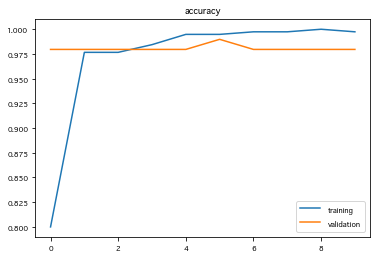

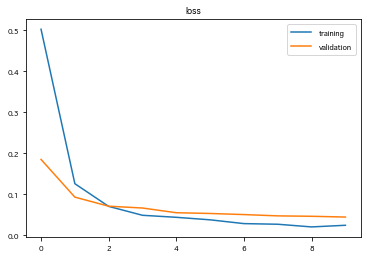

In [42]:
# 모델의 정확도를 시각적으로 표현

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

plt.plot(epochs, accuracy, label='training')
plt.plot(epochs, val_accuracy, label='validation')
plt.legend()
plt.title('accuracy')
plt.figure()

plt.plot(epochs, loss, label='training')
plt.plot(epochs, val_loss, label='validation')
plt.legend()
plt.title('loss')

2022-05-11 16:17:06.446190: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


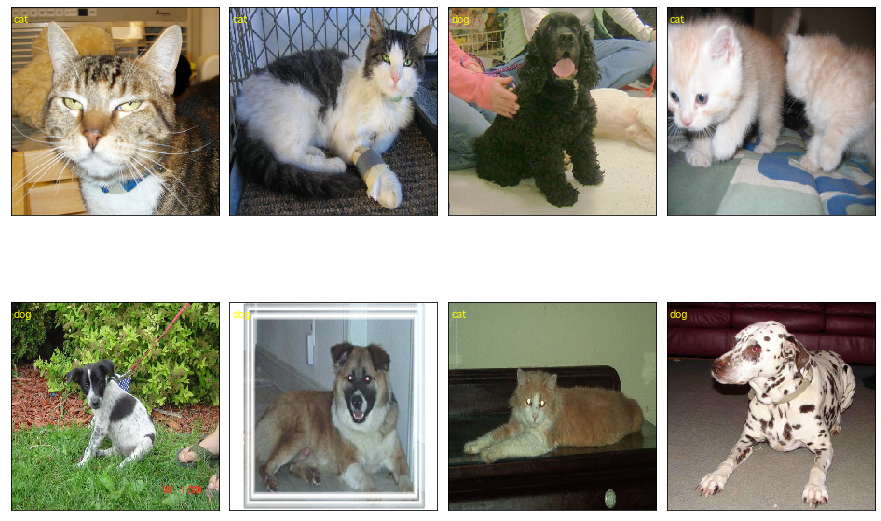

In [43]:
# 이미지에 대한 예측 확인

class_names = ['cat', 'dog']
validation, label_batch = next(iter(valid_generator))
prediction_values = np.argmax(model.predict(validation), axis=-1)

fig = plt.figure(figsize=(12,8))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

for i in range(8):
    ax = fig.add_subplot(2, 4, i+1, xticks=[], yticks=[])
    ax.imshow(validation[i,:], cmap=plt.cm.gray_r, interpolation='nearest')
    if prediction_values[i] == np.argmax(label_batch[i]):
        ax.text(3, 17, class_names[prediction_values[i]], color='yellow', fontsize=14)
    else:
        ax.text(3, 17, class_names[prediction_values[i]], color='red', fontsize=14)

## 5.3.2 Fine-Tuning

# 5.4 Explainable CNN

## 5.4.1 Feature Map Visualization

In [44]:
!pip install keras

In [48]:
# 필요한 라이브러리 호출

import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

In [47]:
!pip install opencv-python

     |████████████████████████████████| 29.9 MB 10.9 MB/s            


In [49]:
# 새로운 모델 생성

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(input_shape=(100,100,3), activation='relu',
                           kernel_size=(5,5), filters=32),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(activation='relu', kernel_size=(5,5), filters=64),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(activation='relu', kernel_size=(5,5), filters=64),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(activation='relu', kernel_size=(5,5), filters=64),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(2, activation='relu')
])
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 96, 96, 32)        2432      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 44, 44, 64)        51264     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 22, 22, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 18, 18, 64)        102464    
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 9, 9, 64)          0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 5, 5, 64)         

In [50]:
# 특성 맵 정의

ins = model.inputs
outs = model.layers[0].output
feature_map = Model(inputs=ins, outputs=outs)
feature_map.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4_input (InputLayer)  [(None, 100, 100, 3)]     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 96, 96, 32)        2432      
Total params: 2,432
Trainable params: 2,432
Non-trainable params: 0
_________________________________________________________________


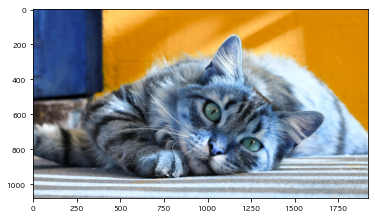

In [51]:
img = cv2.imread('data/chap05/cat.jpg')
plt.imshow(img)

(1, 100, 100, 3)
(1, 96, 96, 32)


2022-05-11 16:35:19.044245: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


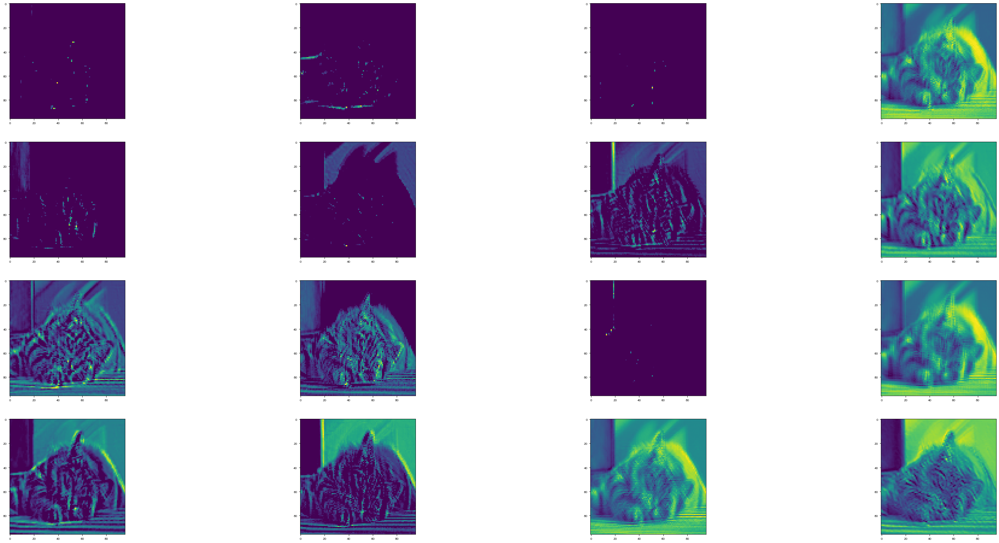

In [52]:
# 이미지 전처리 및 특성 맵 확인

img = cv2.resize(img, (100,100))
input_img = np.expand_dims(img, axis=0)
print(input_img.shape)

feature = feature_map.predict(input_img)
print(feature.shape)
fig = plt.figure(figsize=(50,50))
for i in range(16):
    ax = fig.add_subplot(8, 4, i+1)
    ax.imshow(feature[0,:,:,i])

2022-05-11 16:37:19.884678: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


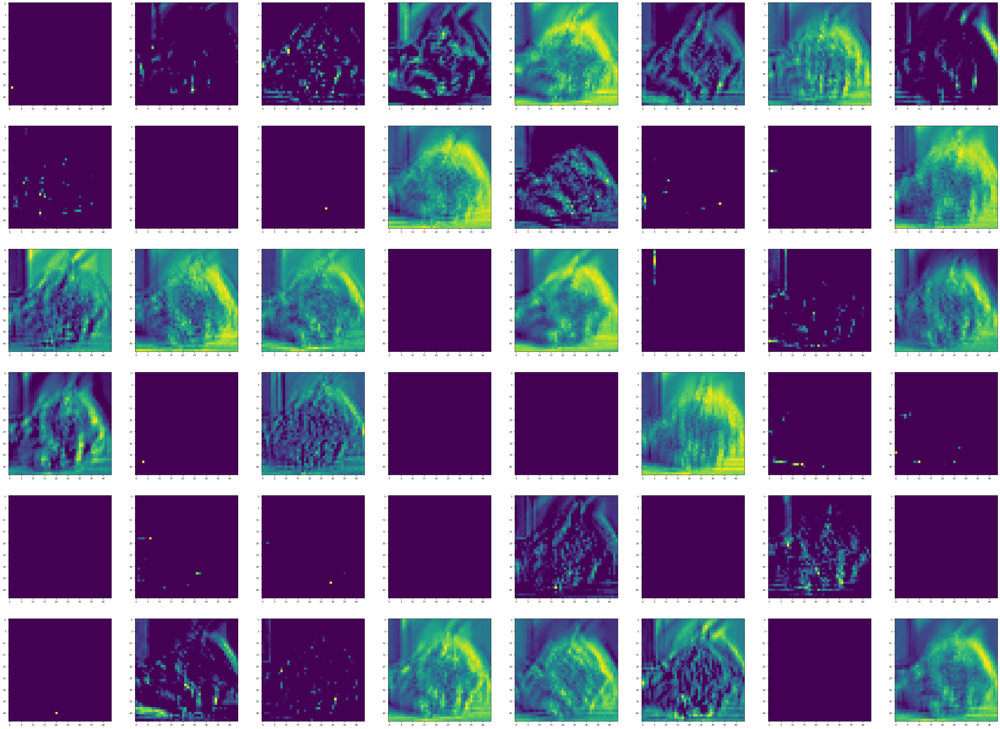

In [53]:
# 이미지를 모델에 적용

ins = model.inputs
outs = model.layers[2].output
feature_map = Model(inputs=ins, outputs=outs)

img = cv2.imread('data/chap05/cat.jpg')
img = cv2.resize(img, (100,100))
input_img = np.expand_dims(img, axis=0)

feature = feature_map.predict(input_img)
fig = plt.figure(figsize=(50,50))
for i in range(48):
    ax = fig.add_subplot(8, 8, i+1)
    ax.imshow(feature[0,:,:,i])

2022-05-11 16:38:33.833374: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


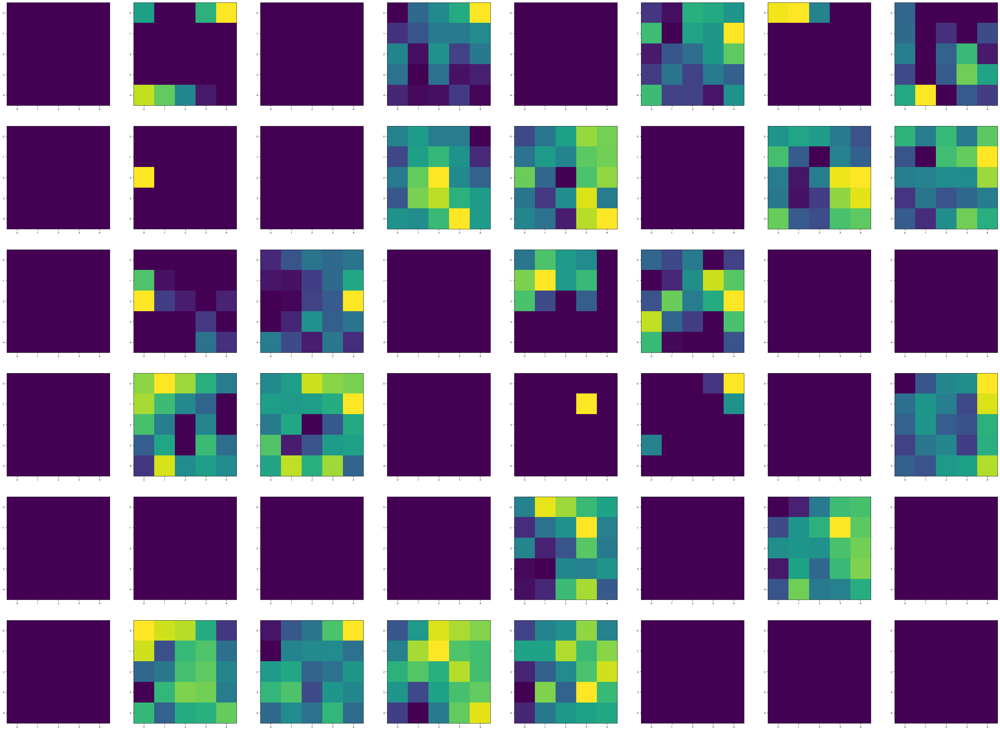

In [55]:
# 이미지를 모델에 적용

ins = model.inputs
outs = model.layers[6].output
feature_map = Model(inputs=ins, outputs=outs)

img = cv2.imread('data/chap05/cat.jpg')
img = cv2.resize(img, (100,100))
input_img = np.expand_dims(img, axis=0)

feature = feature_map.predict(input_img)
fig = plt.figure(figsize=(50,50))
for i in range(48):
    ax = fig.add_subplot(8, 8, i+1)
    ax.imshow(feature[0,:,:,i])